## Libraries
Standard import statements, we will need the cosima_cookbook to find ncfiles with velocity data, and we will need the parcels package to advect particles once we have a set of velocity fields.

In [1]:
#https://cosima-cookbook.readthedocs.io/en/latest/index.html
import cosima_cookbook as cc
import numpy as np

#http://oceanparcels.org/gh-pages/html/
from parcels import FieldSet, ParticleSet, Variable, JITParticle, AdvectionRK4, plotTrajectoriesFile, ScipyParticle
import math
from datetime import timedelta, datetime
from operator import attrgetter
from netCDF4 import Dataset, num2date, date2num
import pandas as pd
import sqlite3

import xarray as xr
import numpy as np
from os import environ

import parcels
print('Parcels Version:',parcels.version)

netcdf_index loaded.
Parcels Version: 1.0.6.dev72+g5a215b9


## Finding suitable data
Let's query the COSIMA database for ncfiles that have velocity data for the mom01v5 model and KDS75 experiment

In [2]:
conn = sqlite3.connect(cc.netcdf_index.database_file)

df = pd.read_sql('SELECT id, ncfile, experiment, run, basename, variable '
                 'FROM ncfiles '
                 'WHERE variable = "u" '
                 #'AND basename_pattern LIKE "%!_!_%.nc" ESCAPE "!" '
                 'AND configuration = "mom01v5" '
                 'AND experiment = "KDS75" '
                 'AND basename LIKE "ocean__%" '
                 #'GROUP BY configuration, experiment, basename_pattern '
                 #'ORDER BY configuration, experiment, num_files '
                 'ORDER BY ncfile asc'
                 , conn)
df

## Let's interogate an ocean.nc file to see structure

,id,ncfile,experiment,run,basename,variable
0,124885,/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output04...,KDS75,output047,ocean.nc,u
1,1520276,/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output04...,KDS75,output048,ocean.nc,u
2,749638,/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output04...,KDS75,output049,ocean.nc,u
3,500091,/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output05...,KDS75,output050,ocean.nc,u
4,122403,/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output05...,KDS75,output051,ocean.nc,u
5,409024,/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output05...,KDS75,output052,ocean.nc,u
6,1565352,/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output05...,KDS75,output053,ocean.nc,u
7,249062,/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output05...,KDS75,output054,ocean.nc,u
8,1186290,/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output05...,KDS75,output055,ocean.nc,u
9,1598356,/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output05...,KDS75,output056,ocean.nc,u


## Interogate an ncfile with suitable data
We have decided to use output370 folder. The files we need are the ocean__0{year}_0{day}.nc files, let's examine one such file, ocean__0096__003.nc

In [3]:
filename = "/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output370/ocean__0096_003.nc"
from netCDF4 import Dataset

dataset = Dataset(filename)
print("File Format:", dataset.file_format)
print("Dimensions:",dataset.variables.keys())

File Format: NETCDF4_CLASSIC
Dimensions: odict_keys(['xt_ocean', 'yt_ocean', 'time', 'nv', 'xu_ocean', 'yu_ocean', 'st_ocean', 'st_edges_ocean', 'sw_ocean', 'sw_edges_ocean', 'geolon_t', 'geolat_t', 'geolon_c', 'geolat_c', 'temp', 'salt', 'u', 'v', 'pot_rho_0', 'pot_rho_2', 'wt', 'average_T1', 'average_T2', 'average_DT', 'time_bounds'])


In [4]:
#let's understand the u or v variable
print("u:", dataset.variables['u'],'\n')
print("v:", dataset.variables['v'],'\n')
print("geolon_c:", dataset.variables['geolon_c'],'\n')
print("geolat_c:", dataset.variables['geolat_c'],'\n')
print("time:", dataset.variables['time'])

u: <class 'netCDF4._netCDF4.Variable'>
float32 u(time, st_ocean, yu_ocean, xu_ocean)
    long_name: i-current
    units: m/sec
    valid_range: [-10.  10.]
    missing_value: -1e+20
    _FillValue: -1e+20
    cell_methods: time: mean
    time_avg_info: average_T1,average_T2,average_DT
    coordinates: geolon_c geolat_c
    standard_name: sea_water_x_velocity
unlimited dimensions: time
current shape = (1, 75, 2700, 3600)
filling on 

v: <class 'netCDF4._netCDF4.Variable'>
float32 v(time, st_ocean, yu_ocean, xu_ocean)
    long_name: j-current
    units: m/sec
    valid_range: [-10.  10.]
    missing_value: -1e+20
    _FillValue: -1e+20
    cell_methods: time: mean
    time_avg_info: average_T1,average_T2,average_DT
    coordinates: geolon_c geolat_c
    standard_name: sea_water_y_velocity
unlimited dimensions: time
current shape = (1, 75, 2700, 3600)
filling on 

geolon_c: <class 'netCDF4._netCDF4.Variable'>
float32 geolon_c(yu_ocean, xu_ocean)
    long_name: uv longitude
    units: degr

In [5]:
for i in dataset.variables:
    print("Variable:{0:20} \t Long name:{1:20} \t Units:{2:20}".format(i, dataset.variables[i].long_name, dataset.variables[i].units))

Variable:xt_ocean             	 Long name:tcell longitude      	 Units:degrees_E           
Variable:yt_ocean             	 Long name:tcell latitude       	 Units:degrees_N           
Variable:time                 	 Long name:time                 	 Units:days since 0001-01-01 00:00:00
Variable:nv                   	 Long name:vertex number        	 Units:none                
Variable:xu_ocean             	 Long name:ucell longitude      	 Units:degrees_E           
Variable:yu_ocean             	 Long name:ucell latitude       	 Units:degrees_N           
Variable:st_ocean             	 Long name:tcell zstar depth    	 Units:meters              
Variable:st_edges_ocean       	 Long name:tcell zstar depth edges 	 Units:meters              
Variable:sw_ocean             	 Long name:ucell zstar depth    	 Units:meters              
Variable:sw_edges_ocean       	 Long name:ucell zstar depth edges 	 Units:meters              
Variable:geolon_t             	 Long name:tracer longitude     	

## Understand variables, find location that is vortex-dominated
We can see that the longitude/latitude grid we need comes from the geolon_c and geolat_c variables.
The eastward velocity is u, the northward velocity is v, and time is time.
Depth is st_ocean, and vertical velocity is wt (TODO: include vertical velocity in particle advection).

Let's use the Okubo-Weiss parameter ($OW$) to identify regions in the ocean that are vortex-dominated ($OW < |OW^*|$)
For reference:
$$ OW = S_{n}^{2} + S_{s}^{2} - \zeta^{2},\\
S_{n} = u_x - v_y,\\
S_{s} = v_x + u_y,\\
\zeta = v_x + u_y$$
If $OW > OW^*$ (where $OW^*$ is some 'cutoff' value), then that region is "strain dominated", and if $OW < |OW^*|$, then that region is "vortex dominated".
We are interested in regions that are vortex dominated.


In [6]:
#geolon_c, geolat_c are our coordinates
#time is time
#u is eastward velocity
#v is northward velocity
#wt is vertical velocity (TODO: is it +ve down or up?)

In [7]:
#dataset_lon = np.ma.filled(dataset.variables['geolon_c'], np.nan)
#dataset_lat = np.ma.filled(dataset.variables['geolat_c'], np.nan)
#dataset_time = np.ma.filled(dataset.variables['time'], np.nan)
#dataset_u = np.ma.filled(dataset.variables['u'], 0)[0,0,:,:] #[time, depth, lon, lat]
#dataset_v = np.ma.filled(dataset.variables['v'], 0)[0,0,:,:] #[time, depth, lon, lat]



In [8]:
#dataset_u_x = np.gradient(dataset_u, axis = 1)
#dataset_u_y = np.gradient(dataset_u, axis = 0)
#dataset_v_x = np.gradient(dataset_v, axis = 1)
#dataset_v_y = np.gradient(dataset_v, axis = 0)

#Su = dataset_u_x - dataset_v_y

#Sn = dataset_v_x + dataset_u_y

#zeta = dataset_v_x - dataset_u_y

In [9]:
#OW = Su**2 + Sn**2 - zeta**2



In [10]:
#[X,Y] = np.meshgrid(np.linspace(0,1,2700),np.linspace(0,1,3600), indexing='ij')
#print(X.shape)
#ow_scatter=plt.scatter(X,Y, c=OW)
#plt.colorbar(ow_scatter)
#plt.show()

## Advect particles forward in time and save their results
With the use of the parcels python package (http://oceanparcels.org/gh-pages/html/), we read in all ocean__0{year}__0{day}.nc files from the mom01v5 model, KDS75 experiment, and output370 folder.
Parcels allows us to use an asterix (*) to read in all relevant files.

We restrict the longitude and latitude, because there are some issues with NaN values.

These create what is known as a 'Fieldset', essentially a set of velocity fields that we can use to advect particles.

(TODO: find the underlying cause for the breakage, often comes up as a TypeError, also include vertical velocity (wt))

In [11]:
modelname = 'mom01v5'
experimentname = 'KDS75'
experimentfile = 'output370'


filenames = "/g/data3/hh5/tmp/cosima/mom01v5/KDS75/output370/ocean__*.nc"

variables = {'U': 'u',
             'V': 'v'}
#dimensions = {'lat': 'geolat_c',
#              'lon': 'geolon_c',
#              'time': 'time',
#              'depth': 'st_ocean'}
dimensions = {'lat': 'yu_ocean',
              'lon': 'xu_ocean',
              'time': 'time',
              'depth': 'st_ocean'}

indices = {'lon': range(2400, 3600), 'lat': range(250, 1300)} #{'lon': range(800, 1500), 'lat': range(400, 1100)}

fieldset = FieldSet.from_netcdf(filenames, variables, dimensions, indices)


/home/561/md6918/.local/lib/python3.6/site-packages/xarray/coding/times.py:132: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  enable_cftimeindex)
/home/561/md6918/.local/lib/python3.6/site-packages/xarray/coding/variables.py:66: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  return self.func(self.array[key])


In [12]:
#get an idea of the longitude range we have
fieldset.U.lon

array([-39.9, -39.8, -39.7, ...,  79.8,  79.9,  80. ], dtype=float32)

In [13]:
#get an idea of the latitude range we have
fieldset.U.lat

array([-70.52767  , -70.485435 , -70.44319  , ...,   5.2924585,
         5.392024 ,   5.4915733], dtype=float32)

In [14]:
"""#Testing?
fieldset.add_constant('halo_west', fieldset.U.grid.lon[0])
fieldset.add_constant('halo_east', fieldset.U.grid.lon[-1])
fieldset.add_constant('halo_south', fieldset.V.grid.lon[0])
fieldset.add_constant('halo_north', fieldset.V.grid.lon[-1])


fieldset.add_periodic_halo(zonal=True)

def periodicBC(particle, fieldset, time, dt):
    if particle.lon < fieldset.halo_west:
        particle.lon += fieldset.halo_east - fieldset.halo_west
    elif particle.lon > fieldset.halo_east:
        particle.lon -= fieldset.halo_east - fieldset.halo_west
    if particle.lat < fieldset.halo_south:
        particle.lon += fieldset.halo_north - fieldset.halo_south
    elif particle.lon > fieldset.halo_north:
        particle.lon -= fieldset.halo_north - fieldset.halo_south"""

"#Testing?\nfieldset.add_constant('halo_west', fieldset.U.grid.lon[0])\nfieldset.add_constant('halo_east', fieldset.U.grid.lon[-1])\nfieldset.add_constant('halo_south', fieldset.V.grid.lon[0])\nfieldset.add_constant('halo_north', fieldset.V.grid.lon[-1])\n\n\nfieldset.add_periodic_halo(zonal=True)\n\ndef periodicBC(particle, fieldset, time, dt):\n    if particle.lon < fieldset.halo_west:\n        particle.lon += fieldset.halo_east - fieldset.halo_west\n    elif particle.lon > fieldset.halo_east:\n        particle.lon -= fieldset.halo_east - fieldset.halo_west\n    if particle.lat < fieldset.halo_south:\n        particle.lon += fieldset.halo_north - fieldset.halo_south\n    elif particle.lon > fieldset.halo_north:\n        particle.lon -= fieldset.halo_north - fieldset.halo_south"

## Create a set of particles to advect
We are interested in how particles flow from the east coast of Africa, down to the tip, on the Agulhas current. This is a region that exhibits a number of eddies called 'Agulhas rings'.
To do this, we want to create a list of 'parcles' or 'particles', with their initial latitude/longitude positions. We create a starting longitude of +20E and an ending longitude of +45E. We create a starting latitude of -25N and an ending longitude of -50N. For every 0.1degrees east/west and north/south within this 'square' we place a parcel/particle.

We then plot this initial location so you can physically see where we are talking about!

In [15]:

start_lon = 0 #-145
end_lon = 45 #-165
n_lon = np.abs(start_lon - end_lon)/0.1
#running out of memory issues?

start_lat = -25. #
end_lat = -55.
n_lat = np.abs(start_lat - end_lat)/0.1

[longitude, latitude] = np.meshgrid(np.linspace(start_lon, end_lon,n_lon), np.linspace(start_lat, end_lat,n_lat), indexing='ij')



/g/data3/hh5/public/apps/miniconda3/envs/analysis3-18.07/lib/python3.6/site-packages/ipykernel/__main__.py:11: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.


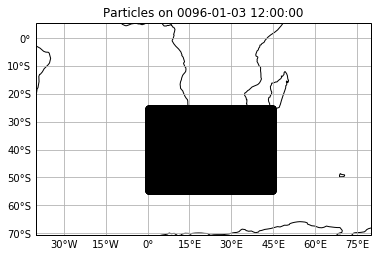

In [16]:
#create particle set and show
pset = ParticleSet.from_list(fieldset=fieldset, pclass=JITParticle, lon=longitude, lat=latitude)
#pset = ParticleSet.from_list(fieldset=fieldset, pclass=ScipyParticle, lon=longitude, lat=latitude)

pset.show()

## Advecting the set of particles and saving the output
We will save files with the format 'modelname_experimentname_experimentfile_trajectories.nc' (mind you, this will likely change with some extra parameters involved).

We will advect the particles for 60 days, saving down each particles longitude/latitude every 24 hours, giving us a total of 60 timesteps. We will use the Runge-Kutta (4,5) method to advect the particles

(TODO: why does dt = 1day work with outputdt being 12hr? does this make sense?, also swap to RK45...)

In [17]:
modelname = 'mom01v5'
experimentname = 'KDS75'
experimentfile = 'output370'

outputfilename = modelname+'_'+experimentname+'_'+experimentfile+'_trajectories'

In [18]:

output_file = pset.ParticleFile(name=outputfilename, outputdt=timedelta(days=1)) #hours=12
pset.execute(AdvectionRK4, runtime=timedelta(days=60), dt=timedelta(days=1), output_file=output_file)

INFO: Compiled JITParticleAdvectionRK4 ==> /local/v45/md6918/tmp/parcels-13402/b96a259e0cb8b937ac902c751e5085b2.so
INFO:parcels.tools.loggers:Compiled JITParticleAdvectionRK4 ==> /local/v45/md6918/tmp/parcels-13402/b96a259e0cb8b937ac902c751e5085b2.so
/home/561/md6918/.local/lib/python3.6/site-packages/xarray/coding/times.py:132: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  enable_cftimeindex)
/home/561/md6918/.local/lib/python3.6/site-packages/xarray/coding/variables.py:66: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  return self.func(self.array[key])
100% (5184000.0 of 5184000.0) |##########| Elapsed Time: 3:12:15 Time:  3:12:15


## Plot the trajectories of the particles from the file
We use the parcles 'plotTrajectoriesFile' method to plot the trajectories in 2d for illustration.

(TODO: add the save image to file argument below)

/home/561/md6918/.local/lib/python3.6/site-packages/xarray/coding/times.py:132: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  enable_cftimeindex)
/home/561/md6918/.local/lib/python3.6/site-packages/xarray/coding/variables.py:66: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  return self.func(self.array[key])


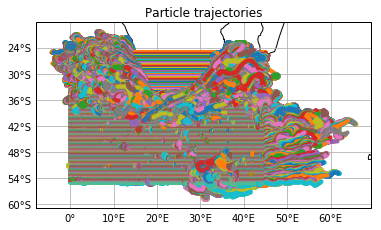

<module 'matplotlib.pyplot' from '/g/data3/hh5/public/apps/miniconda3/envs/analysis3-18.07/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [19]:
plotTrajectoriesFile(outputfilename+'.nc', mode='2d')

## Look to identify coherent structures in the trajectory data
Now that we have the trajectory data, let's read it in and manipulate it into a form that our FEMDL code can use.

(TODO: give everything proper variable names, don't use 'x1' and whatnot!)

In [20]:
filename=outputfilename+'.nc'

try:
    pfile = xr.open_dataset(str(filename), decode_cf=True)
except:
    pfile = xr.open_dataset(str(filename), decode_cf=False)
lon = np.ma.filled(pfile.variables['lon'], np.nan)
lat = np.ma.filled(pfile.variables['lat'], np.nan)
time = np.ma.filled(pfile.variables['time'], np.nan)
z = np.ma.filled(pfile.variables['z'], np.nan)
mesh = pfile.attrs['parcels_mesh'] if 'parcels_mesh' in pfile.attrs else 'spherical'


x1 = lon.transpose()
y1 = lat.transpose()


/home/561/md6918/.local/lib/python3.6/site-packages/xarray/coding/times.py:132: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  enable_cftimeindex)
/home/561/md6918/.local/lib/python3.6/site-packages/xarray/coding/variables.py:66: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  return self.func(self.array[key])


In [21]:

nt = x1.shape[0]
n = x1.shape[1]

p = np.zeros((nt,2,n)) #change to timesteps, xy, number of particles
pb = np.array([np.arange(0,n), np.arange(0,n)])

In [22]:

x1.shape[0]


nt

61

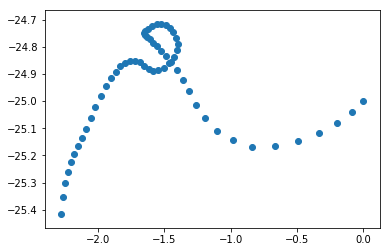

In [23]:


for i in range(0,nt):
    for j in range(0,n):
        p[i,0,j] = x1[i,j]
        p[i,1,j] = y1[i,j]

#Plot the top left particle and it's trajectory (note: this one is on land, hence doesn't move...)
import matplotlib.pyplot as plt
plt.scatter(p[:,0,0], p[:,1,0])


In [24]:
#plot the trajectories of 50 particles (that aren't stuck on land!)
#for i in range(60000,60050):
#    plt.scatter(p[:,0,i], p[:,1,i])

## Import and define all functions necessary

In [25]:


# Add path to FEMDL code 
#import sys
#sys.path.append('../../src')

# Import Statements
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
from scipy.spatial import Delaunay
from scipy.sparse import csc_matrix
from scipy.sparse.linalg import eigs
from matplotlib.tri import Triangulation

#From src/normed.py
from numpy.linalg import norm
from numpy import inf
def normed(x):
    y = x/norm(x,inf)
    return y

#From src/flow_map.py
import sys
from numpy import conj, transpose

def flow_map(v, x, tspan):

    x0 = x[0,:]
    y0 = x[1,:]

    [Fx,Fy] = integrator(v,x0,y0,tspan)

    y =  np.array((conj(transpose(Fx)), conj(transpose(Fy))))

    return y

#From src/integrator.py
from scipy import integrate
from numpy import concatenate

def integrator(v, x0, y0, tspan):
    #Ps = integrate.odeint(rotating_double_gyre_vf, np.concatenate((x0,y0)), tspan, tfirst=True)
    tminmax = np.array((tspan[0],tspan[-1]))
    Ps = integrate.solve_ivp(v, tminmax, concatenate((x0,y0)), method='RK45', vectorized=True, atol=1e-3, rtol=1e-3, t_eval=tspan)
    print('Integrator: ' + Ps.message)
    F = Ps.y

    xt = F[0:len(x0),:]
    yt = F[len(x0):,:]

    return xt, yt

#From src/gradbasis.py
from numpy import asarray, array
def gradbasis(p,t):

    v = []
    #inserting with positions rather than append to make sure order is correct
    v.insert(0, p[:,t[:,2]] - p[:,t[:,1]])
    v.insert(1, p[:,t[:,0]] - p[:,t[:,2]])
    v.insert(2, p[:,t[:,1]] - p[:,t[:,0]])
    
    v = np.asarray(v) #make as np array so indexing is normal

    area = 0.5*(-v[2,0,:]*v[1,1,:] + v[2,1,:]*v[1,0,:])

    dphi = []
    dphi.insert(0, -v[:,1,:]/(2*area))
    dphi.insert(1, v[:,0,:]/(2*area))
    dphi = np.asarray(dphi)

    area = abs(area)

    return dphi, area

#From src/assemble.py
from numpy import max,concatenate, ones
from scipy.sparse import csc_matrix, lil_matrix 
def assemble(p,t,pb=None,G=None):
    #def assemble(p,t,pb=None,G=None):
    n = len(p[0])
    #n = max(pb[1,:]) + 1 #number of nodes
    m = len(t)

    #use lil_matrix as they are quicker when updating element by element.
    D = lil_matrix((n, n)) 
    M = lil_matrix((n, n))

    for e in range(0,len(t)):
        ns = t[e,:]
        P = np.transpose(np.stack((np.ones(3), p[0,ns], p[1,ns])))
        area = np.abs(np.linalg.det(P))/2
        B = np.linalg.inv(P)
        grad = B[1:,:]
        N = - area*np.dot(np.transpose(grad),grad)
        K = area/12*(np.ones((3,3)) + np.eye(3))
        
        
        #TO DO: Convert code below into 2 lines using matrix functions
        D[ns[0],ns[0]] = D[ns[0],ns[0]] + N[0,0]
        D[ns[0],ns[1]] = D[ns[0],ns[1]] + N[0,1]
        D[ns[0],ns[2]] = D[ns[0],ns[2]] + N[0,2]
        D[ns[1],ns[0]] = D[ns[1],ns[0]] + N[1,0]
        D[ns[1],ns[1]] = D[ns[1],ns[1]] + N[1,1]
        D[ns[1],ns[2]] = D[ns[1],ns[2]] + N[1,2]
        D[ns[2],ns[0]] = D[ns[2],ns[0]] + N[2,0]
        D[ns[2],ns[1]] = D[ns[2],ns[1]] + N[2,1]
        D[ns[2],ns[2]] = D[ns[2],ns[2]] + N[2,2]

        M[ns[0],ns[0]] = M[ns[0],ns[0]] + K[0,0]
        M[ns[0],ns[1]] = M[ns[0],ns[1]] + K[0,1]
        M[ns[0],ns[2]] = M[ns[0],ns[2]] + K[0,2]
        M[ns[1],ns[0]] = M[ns[1],ns[0]] + K[1,0]
        M[ns[1],ns[1]] = M[ns[1],ns[1]] + K[1,1]
        M[ns[1],ns[2]] = M[ns[1],ns[2]] + K[1,2]
        M[ns[2],ns[0]] = M[ns[2],ns[0]] + K[2,0]
        M[ns[2],ns[1]] = M[ns[2],ns[1]] + K[2,1]
        M[ns[2],ns[2]] = M[ns[2],ns[2]] + K[2,2]

    return [D.tocsc(),M.tocsc()] #want to use csc matrices for speed when adding matrices together
    
    
    """n = max(pb[1,:]) + 1
    m = len(t)

    dphi, area = gradbasis(p,t)

    D = csc_matrix((n, n))
    M = csc_matrix((n, n))
    
    
    for i in range(0,3):
        for j in range(0,3):
            #Is the formula for Dij wrong?
            Dij = -area*(dphi[0,i,:]*G[:,0]*dphi[0,j,:] + dphi[0,i,:]*G[:,1]*dphi[1,j,:] + dphi[1,i,:]*G[:,1]*dphi[0,j,:] + dphi[1,i,:]*G[:,2]*dphi[1,j,:])
            Mij = area/12*np.ones(np.shape(dphi[0,i]))
            I = pb[1, t[:,i]]
            J = pb[1, t[:,j]]
            
            if (i == j):
                D = D + csc_matrix((Dij, (I,J)), shape=(n,n))           
                M = M + csc_matrix((Mij+ area/12, (I,J)), shape=(n,n))

            else:
                D = D + csc_matrix((concatenate((Dij,Dij)), (concatenate((I,J)), concatenate((J,I)))), shape=(n,n))
                M = M + csc_matrix((concatenate((Mij,Mij)), (concatenate((I,J)), concatenate((J,I)))), shape=(n,n))
    
    return [D, M]
    """


## For illustrative purposes, plot the flow of the particles
Coloured by initial horizontal coordinates, note the top-left portion that doesn't move, that's on land!

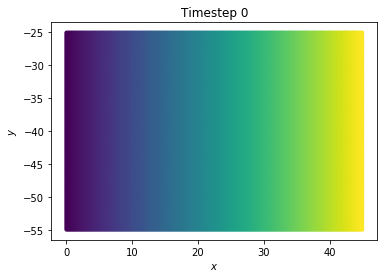

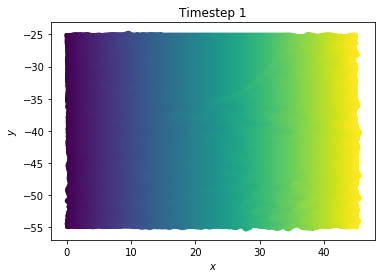

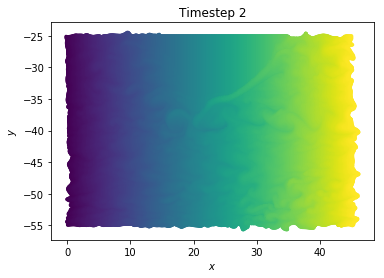

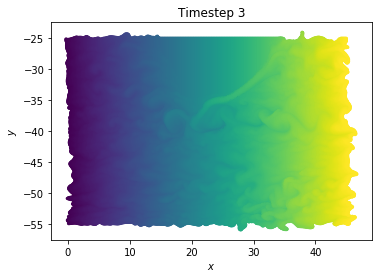

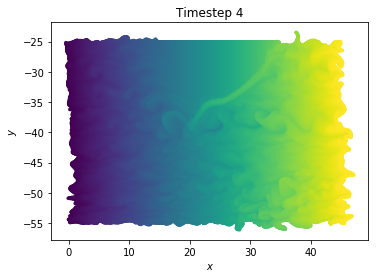

...

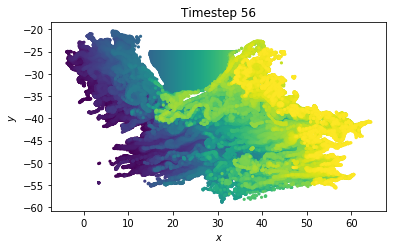

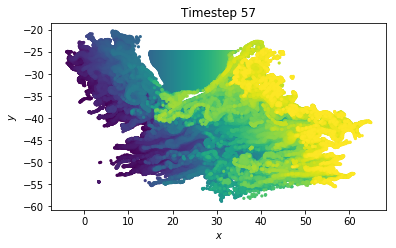

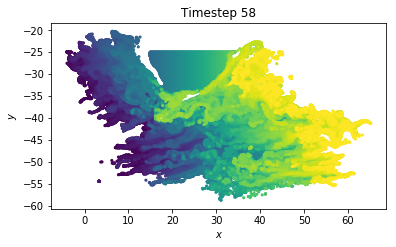

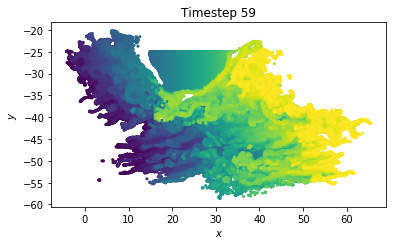

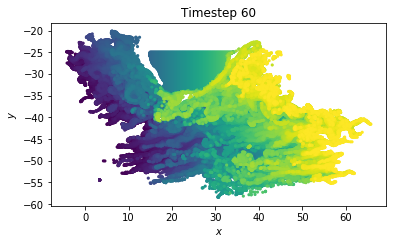

In [26]:

for i in range(nt):
    fig, ax = plt.subplots()
    ax.scatter(p[i,0,:], p[i,1,:], c=longitude.flatten(), s=10, edgecolors="none")
    ax.set(aspect=1, xlabel='$x$',  ylabel='$y$')
    plt.title('Timestep ' + str(i))
    plt.show()


## Compute Stiffness/Mass Matrices, and solve the Eigenproblem

In [27]:

#delaunay options
options = 'Qt Qbb Qc'

t = [] #stores our Delaunay simplices

D = sp.sparse.csc_matrix((n, n))
M = sp.sparse.csc_matrix((n, n))

for k in range(0,nt):
    t.insert(k, Delaunay(np.transpose(p[k]), qhull_options=options).vertices)
    
    # Want to remove simplices with zero volume
    keep = np.ones(len(t[k]), dtype = bool)
    for i, z in enumerate(t[k]):
        if abs(np.linalg.det(np.hstack((np.transpose(p[k])[z], np.ones([1,3]).T)))) < 1E-15:
            keep[i] = False # Point is coplanar, we don't want to keep it
    t[k] = t[k][keep]

    A = np.kron([1, 0, 1], np.ones((len(t[k]),1)))
    
    [Dt, Mt] = assemble(p[k], t[k], pb, A)

    D = D + Dt
    M = M + Mt


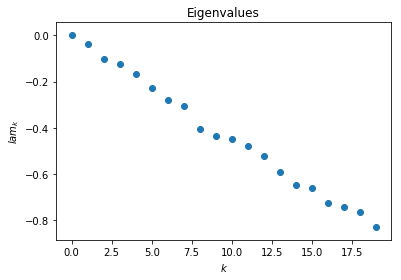

Eigenvalues: [-5.08956567e-13 -3.87515399e-02 -1.02516693e-01 -1.24119115e-01
 -1.68973791e-01 -2.29062545e-01 -2.80884539e-01 -3.06805769e-01
 -4.07352429e-01 -4.37237759e-01 -4.47302596e-01 -4.79935997e-01
 -5.21391213e-01 -5.93437947e-01 -6.48548903e-01 -6.60453794e-01
 -7.26346099e-01 -7.44280596e-01 -7.63973649e-01 -8.29213121e-01]


In [28]:
# Solve Eigenproblem
from scipy.sparse.linalg import eigsh
L,V = eigsh(D, 20, M, sigma=0, which='LM')

pos = (-L).argsort()
lam = L[pos]
ord = V[:,pos]

# Plot Eigenvalues
fig, lamx = plt.subplots()
lamx.scatter(np.arange(0,20), lam)
lamx.set(title='Eigenvalues', xlabel='$k$',  ylabel='$lam_k$')
plt.show()
print('Eigenvalues:',lam)



## Plot the second eigenvector

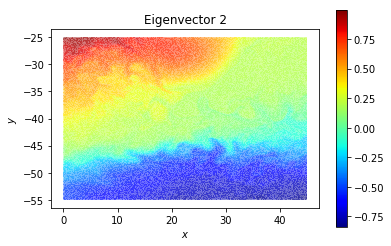

In [29]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.tri as mtri
from matplotlib import cm

timestep = 0
ev = 1 #eig num - 1

triang = mtri.Triangulation(p[timestep,0,:].ravel(), p[timestep,1,:].ravel(), t[timestep])

plt.figure()
plt.axes(xlabel='$x$',  ylabel='$y$', aspect='equal')
plt.title('Eigenvector ' + str(ev+1))
plt.tripcolor(triang, normed(np.real(ord[:,ev])) , cmap=cm.jet, linewidth=0.1, antialiased=True)
plt.colorbar()
plt.show()


## Create plots of each eigenvector

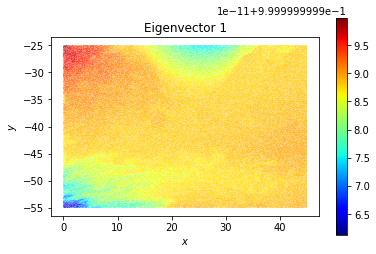

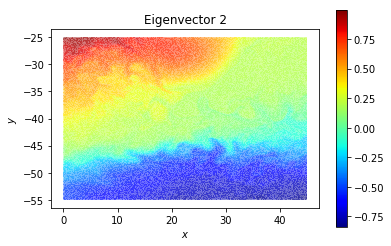

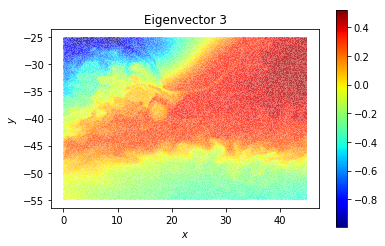

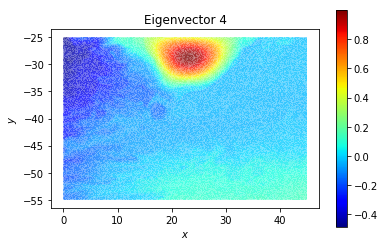

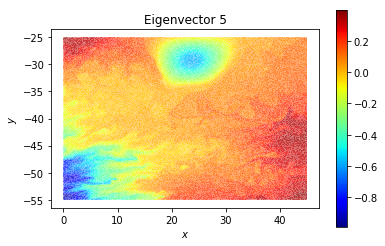

...

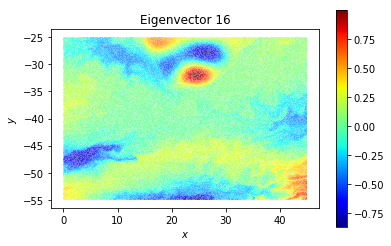

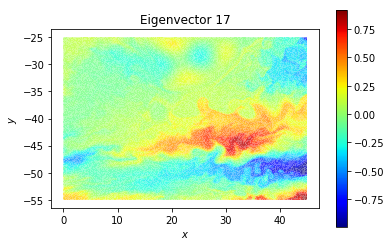

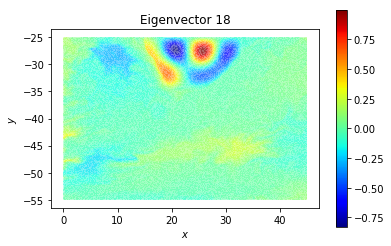

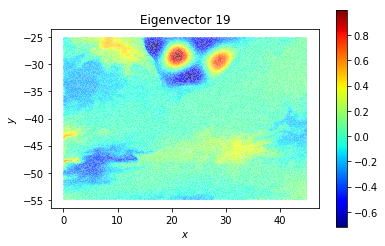

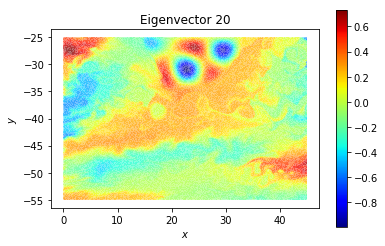

In [30]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.tri as mtri
from matplotlib import cm

timestep = 0


for ev in range(len(lam)):
    triang = mtri.Triangulation(p[timestep,0,:].ravel(), p[timestep,1,:].ravel(), t[timestep])

    plt.figure()
    plt.axes(xlabel='$x$',  ylabel='$y$', aspect='equal')
    plt.title('Eigenvector ' + str(ev+1))
    plt.tripcolor(triang, normed(np.real(ord[:,ev])) , cmap=cm.jet, linewidth=0.1, antialiased=True)
    plt.colorbar()
    plt.show()

# COMMENTS
I think the huge number of stationary particles up the top-left is having an impact on the results. Maybe removing these stationary particles will reduce this?

## Let's remove particles that don't move in the first timestep

In [31]:
p_stationaryindex = []

for particleindex in range(p.shape[2]):
    if p[0,0,particleindex] != p[1,0,particleindex] and p[0,1,particleindex] != p[1,1,particleindex]:
        p_stationaryindex.append(particleindex)
        
p = p[:,:,p_stationaryindex]
n = p.shape[2]
pb = np.array([np.arange(0,n), np.arange(0,n)])

### Let's plot the particles to make sure we got the right ones!

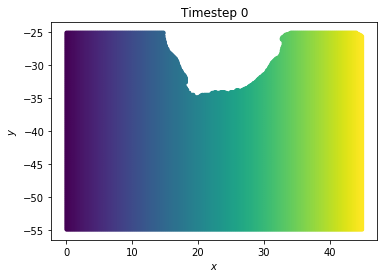

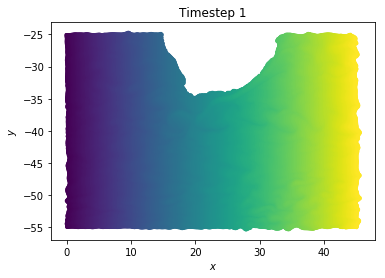

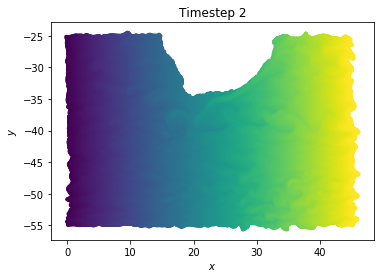

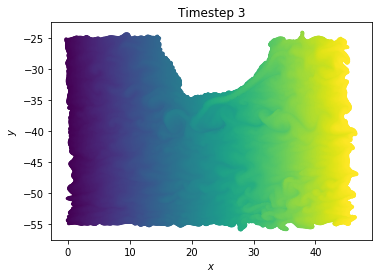

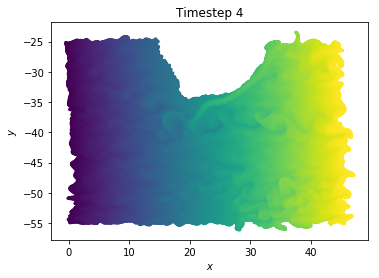

...

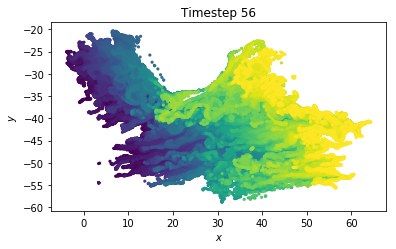

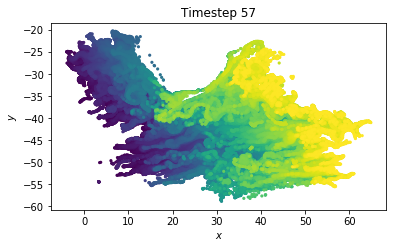

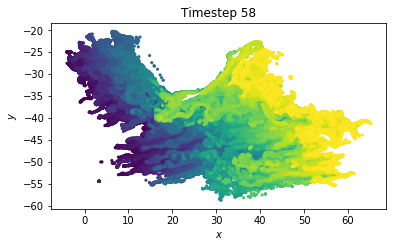

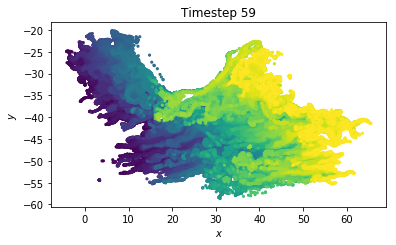

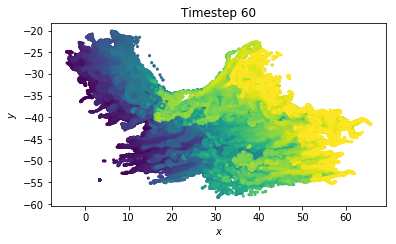

In [32]:

for i in range(nt):
    fig, ax = plt.subplots()
    ax.scatter(p[i,0,:], p[i,1,:], c=p[0,0,:].flatten(), s=10, edgecolors="none")
    ax.set(aspect=1, xlabel='$x$',  ylabel='$y$')
    plt.title('Timestep ' + str(i))
    plt.show()


### Look's like we have a decent set of particles, let's now run it through our FEM algorithm

In [33]:
#delaunay options
options = 'Qt Qbb Qc'

t = [] #stores our Delaunay simplices

D = sp.sparse.csc_matrix((n, n))
M = sp.sparse.csc_matrix((n, n))

for k in range(0,nt):
    t.insert(k, Delaunay(np.transpose(p[k]), qhull_options=options).vertices)
    
    # Want to remove simplices with zero volume
    keep = np.ones(len(t[k]), dtype = bool)
    for i, z in enumerate(t[k]):
        if abs(np.linalg.det(np.hstack((np.transpose(p[k])[z], np.ones([1,3]).T)))) < 1E-15:
            keep[i] = False # Point is coplanar, we don't want to keep it
    t[k] = t[k][keep]

    A = np.kron([1, 0, 1], np.ones((len(t[k]),1)))
    
    [Dt, Mt] = assemble(p[k], t[k], pb, A)

    D = D + Dt
    M = M + Mt


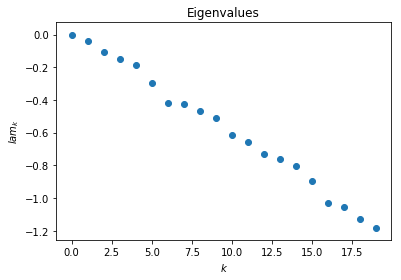

Eigenvalues: [-3.69237921e-13 -3.93608632e-02 -1.04999055e-01 -1.51252965e-01
 -1.85729214e-01 -2.95237031e-01 -4.16210821e-01 -4.24368663e-01
 -4.67169480e-01 -5.12882085e-01 -6.12748432e-01 -6.54988490e-01
 -7.31355150e-01 -7.60183374e-01 -8.02126766e-01 -8.98624967e-01
 -1.02799730e+00 -1.05598712e+00 -1.12602669e+00 -1.18106559e+00]


In [34]:
# Solve Eigenproblem
from scipy.sparse.linalg import eigsh
L,V = eigsh(D, 20, M, sigma=0, which='LM')

pos = (-L).argsort()
lam = L[pos]
ord = V[:,pos]

# Plot Eigenvalues
fig, lamx = plt.subplots()
lamx.scatter(np.arange(0,20), lam)
lamx.set(title='Eigenvalues', xlabel='$k$',  ylabel='$lam_k$')
plt.show()
print('Eigenvalues:',lam)



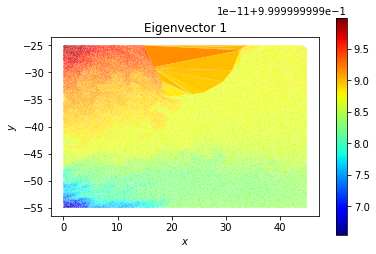

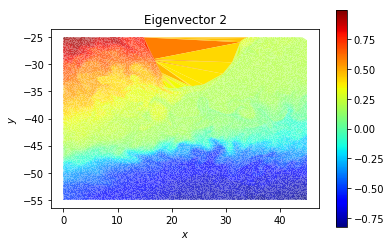

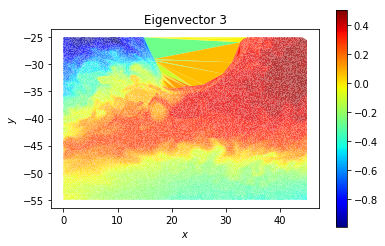

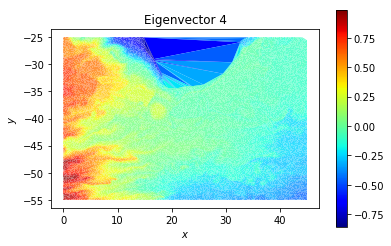

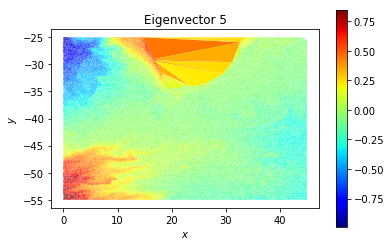

...

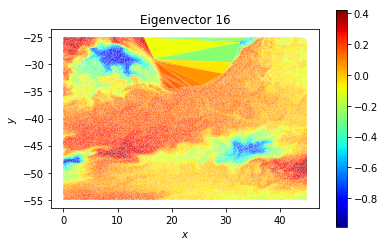

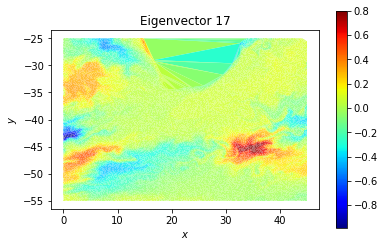

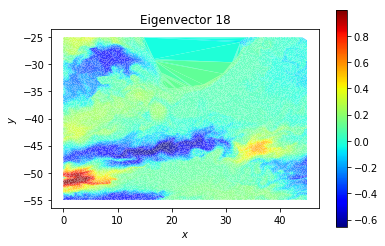

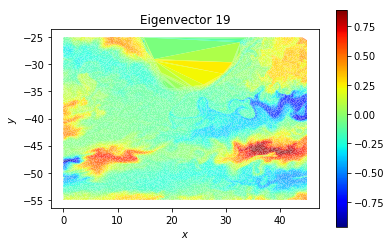

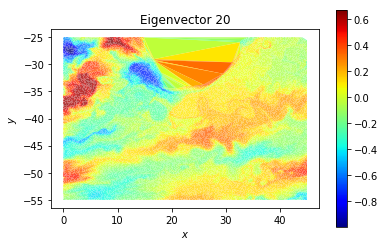

In [35]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.tri as mtri
from matplotlib import cm

timestep = 0


for ev in range(len(lam)):
    triang = mtri.Triangulation(p[timestep,0,:].ravel(), p[timestep,1,:].ravel(), t[timestep])

    plt.figure()
    plt.axes(xlabel='$x$',  ylabel='$y$', aspect='equal')
    plt.title('Eigenvector ' + str(ev+1))
    plt.tripcolor(triang, normed(np.real(ord[:,ev])) , cmap=cm.jet, linewidth=0.1, antialiased=True)
    plt.colorbar()
    plt.show()